# Structural analysis

This is a detailed tutorial for structural analysis of individual images and movies using the the SarcAsM Python package.

Detailed documentation of all functions with parameters and output see [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure).

A detailed list of all analyzed features can be found [here](../structure_features.rst).

Download the Jupyter notebook [here](https://github.com/danihae/SarcAsM/tree/main/docs/notebooks).

In [2]:
from sarcasm import *
from matplotlib import pyplot as plt

## Initialization of SarcAsM object

If SarcAsM is not able to automatically read the pixel size from the tif-file, an error is raised and the pixel size in µm must be entered manually by `SarcAsM(filepath, pixelsize=0.1)`. Additional metadata can be added upon initialization by keyword arguments, e.g., `SarcAsM(filepath, cell_line='WT')`.

All parameters see [API reference](../autoapi/sarcasm/core/index.html#sarcasm.core.SarcAsM).

In [3]:
# enter path of tif-file, can be both single image and movie
filepath = '../../_test_data/20211115_ACTN2_CMs_96well_control_12days.tif'

# initialize SarcAsM object
sarc_obj = SarcAsM(filepath)

## Prediction of sarcomere Z-bands and cell area by deep learning

SarcAsM predicts masks of Z-bands and cell area from fluorescent images using a U-Net convolutional neural network, by `sarc_obj.structure.predict_z_bands()` and `sarc_obj.structure.predict_cell_mask()`. By default, a generalist model trained on a diverse data set, is used. To specify the model, adapt `model_path`.

All parameters see [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.predict_z_bands).

In [3]:
# predict sarcomere z-bands and cell mask
sarc_obj.structure.predict_z_bands()
sarc_obj.structure.predict_cell_mask()

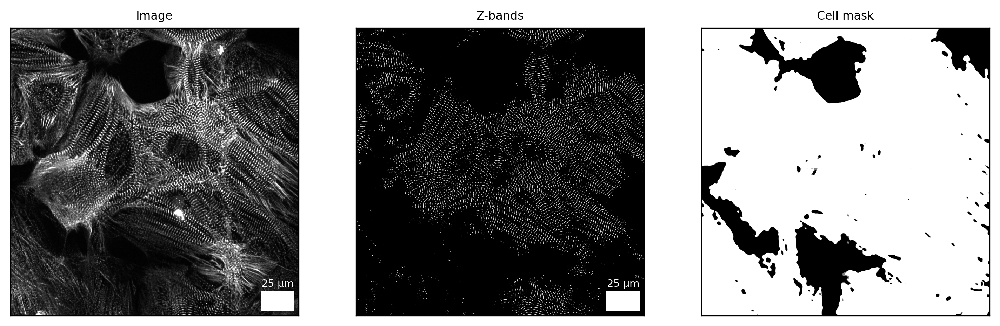

In [4]:
# visualize sarcomere z-bands and cell mask
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

frame = 33

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')

# z-bands
Plots.plot_z_bands(axs[1], sarc_obj, frame=frame, title='Z-bands')

# cell mask
Plots.plot_cell_mask(axs[2], sarc_obj, frame=frame, title='Cell mask')

plt.show()

## Analysis of sarcomere Z-bands

By `sarc_obj.structure.analyze_z_bands()`, SarcAsM segments individual Z-bands and analyzes their length, intensity, orientation and straightness as well as the lateral alignment and distance between neighboring Z-bands and properties of laterally aligned Z-bands. 

Function parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_z_bands).

In [5]:
# analyze z-bands
sarc_obj.structure.analyze_z_bands()

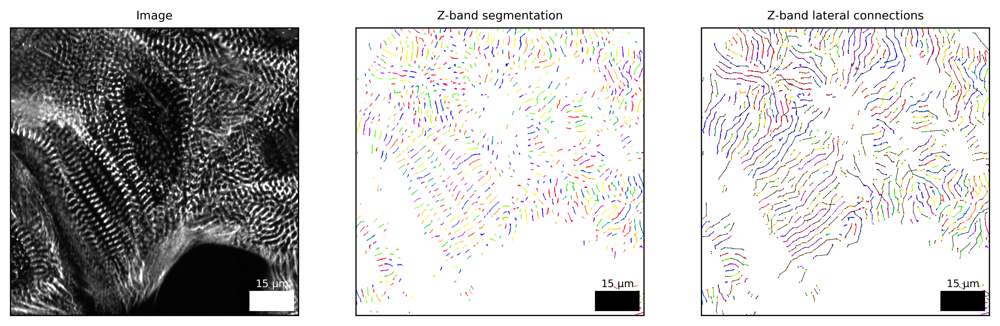

In [6]:
# visualize z-band segmentation and lateral connections
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=500)

frame = 33

xlim, ylim = (300, 1200), (300, 1200)

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

# z-band segmentation
Plots.plot_z_segmentation(axs[1], sarc_obj, frame=frame, title='Z-band segmentation')
axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)

# lateral connections
Plots.plot_z_lateral_connections(axs[2], sarc_obj, frame=frame, title='Z-band lateral connections')
axs[2].set_xlim(xlim)
axs[2].set_ylim(ylim)

plt.show()

## Analysis of sarcomere vectors

By sarc_obj.analyze_sarcomere_vectors(), SarcAsM locally analyzes sarcomere lengths and orientations using a custom wavelet analysis. Adjust range and step size of length and orientation if necessary. 

All parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_sarcomere_vectors).

In [7]:
# analysis of sarcomere vectors
sarc_obj.structure.analyze_sarcomere_vectors()

# optimize parameter 'minor', minor axis length of wavelet (optional)
minor = sarc_obj.structure.optimize_wavelet_minor_axis()

# analyze sarcomere vectors again with optimized 'minor'
sarc_obj.structure.analyze_sarcomere_vectors(minor=minor)

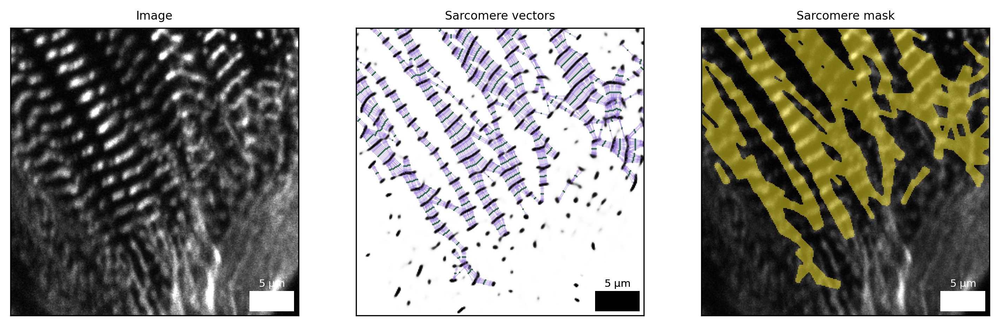

In [7]:
# visualize sarcomere vectors
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

frame = 33

xlim, ylim = (500, 800), (400, 700)

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

# sarcomere vectors (adjust parameters 'linewidths' and 's_points')
Plots.plot_sarcomere_vectors(axs[1], sarc_obj, frame=frame, linewidths=0.003, s_points=10, title='Sarcomere vectors')
axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)

# sarcomere mask
Plots.plot_sarcomere_area(axs[2], sarc_obj, frame=frame, title='Sarcomere mask')
axs[2].set_xlim(xlim)
axs[2].set_ylim(ylim)

plt.show()

## Analysis of myofibrils

By `sarc_obj.structure.analyze_myofibrils()`, SarcAsM estimates the position, length and curvature of myofibrils using a custom line growth algorithm based on sarcomere vectors. 

All parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_myofibrils).

In [ ]:
# myofibril analysis
sarc_obj.structure.analyze_myofibrils()

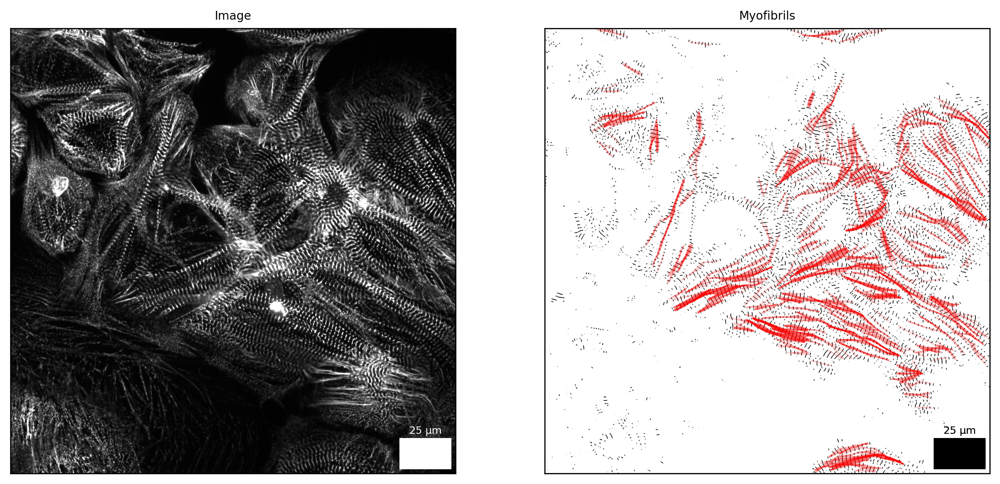

In [9]:
# visualize myofibrils
fig, axs = plt.subplots(ncols=2, figsize=(12, 6), dpi=300)

frame = 30

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')

# myofibril lines
Plots.plot_myofibrils(axs[1], sarc_obj, frame=frame, title='Myofibrils')

plt.show()

## Clustering of sarcomere domains

By `sarc_obj.analyze_sarcomere_domains()`, SarcAsM groups sarcomere vectors into spatial domains with similar orientation using agglomerative clustering. 

All parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_sarcomere_domains).

In [10]:
# analyze sarcomere domains
sarc_obj.structure.analyze_sarcomere_domains()

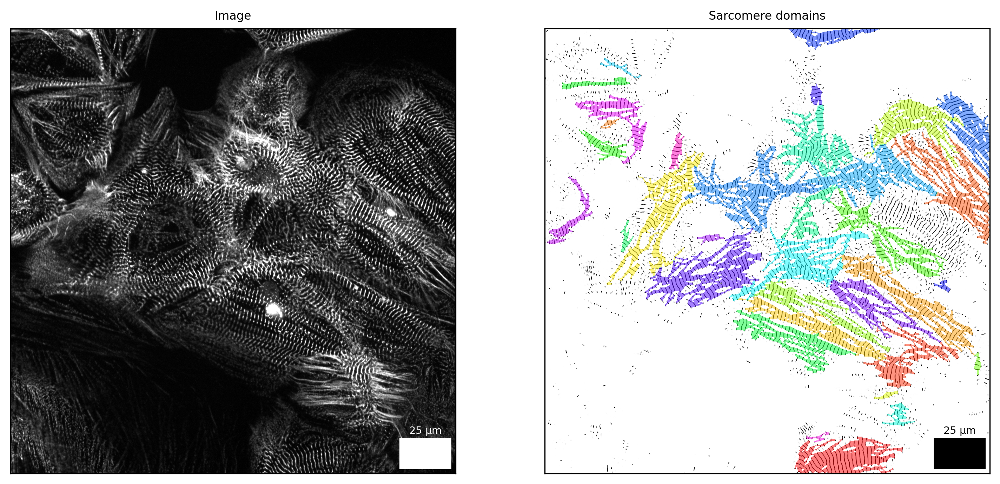

In [10]:
# visualize sarcomere domains
fig, axs = plt.subplots(ncols=2, figsize=(12, 6), dpi=300)

frame = 31

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')

# myofibril lines
Plots.plot_sarcomere_domains(axs[1], sarc_obj, frame=frame, title='Sarcomere domains')

plt.show()